In [1]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
import cv2
import numpy as np
import matplotlib.pyplot as plt
import time

In [2]:
# Загрузка модели
base_model = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(1000, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

In [3]:
for layer in base_model.layers:
    layer.trainable = False

In [4]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [5]:
# Видеоисточник
source = '(Lab5_2)2BMW.mp4'  # Укажите правильный путь
cap = cv2.VideoCapture(source)

if not cap.isOpened():
    print(f"Ошибка: не удалось открыть видеопоток. Источник: {source}")
    exit()

1/1 [==============================] - 1s 626ms/step


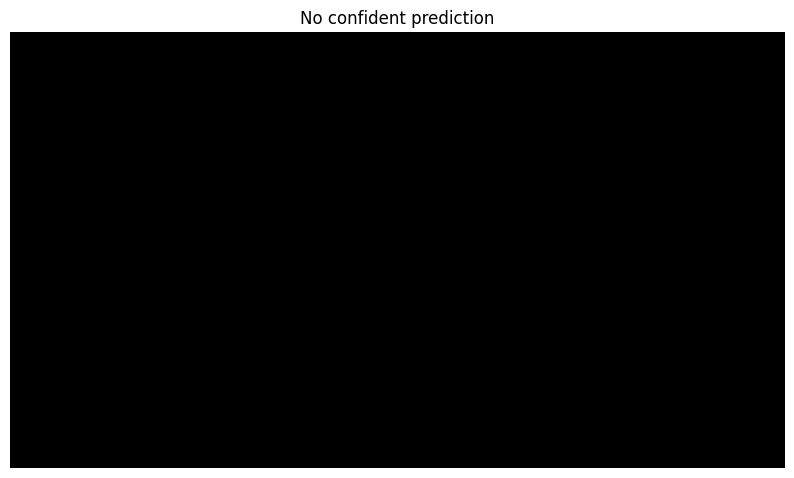

1/1 [==============================] - 0s 133ms/step


<Figure size 640x480 with 0 Axes>

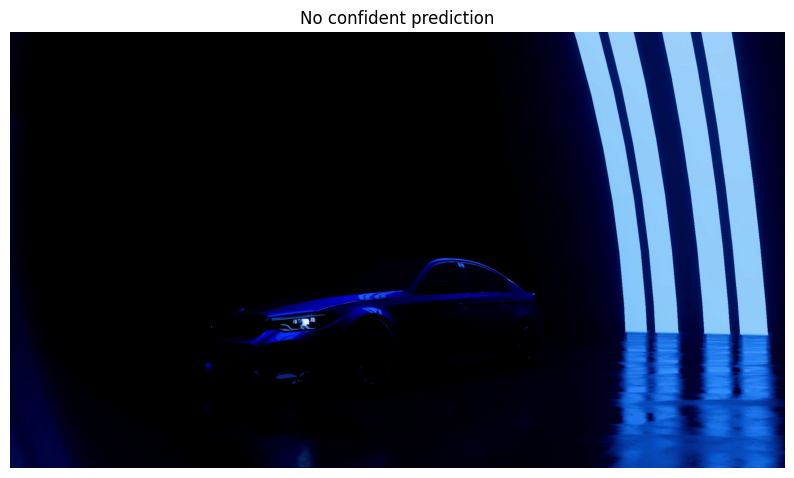

1/1 [==============================] - 0s 93ms/step


<Figure size 640x480 with 0 Axes>

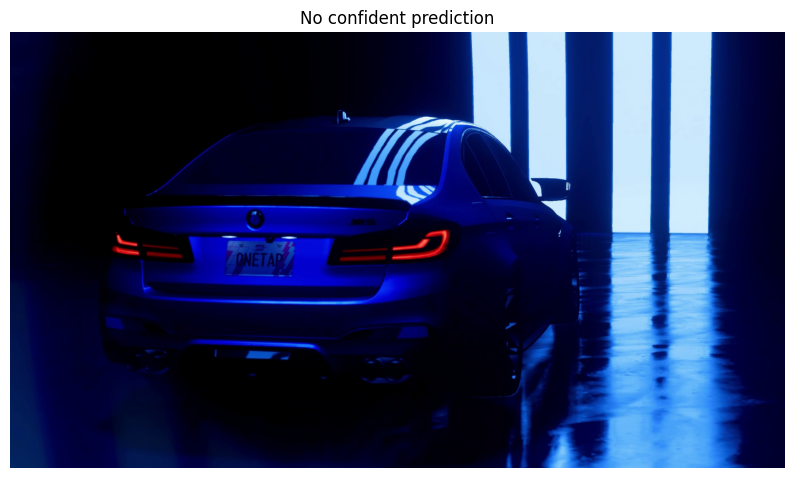

1/1 [==============================] - 0s 133ms/step


<Figure size 640x480 with 0 Axes>

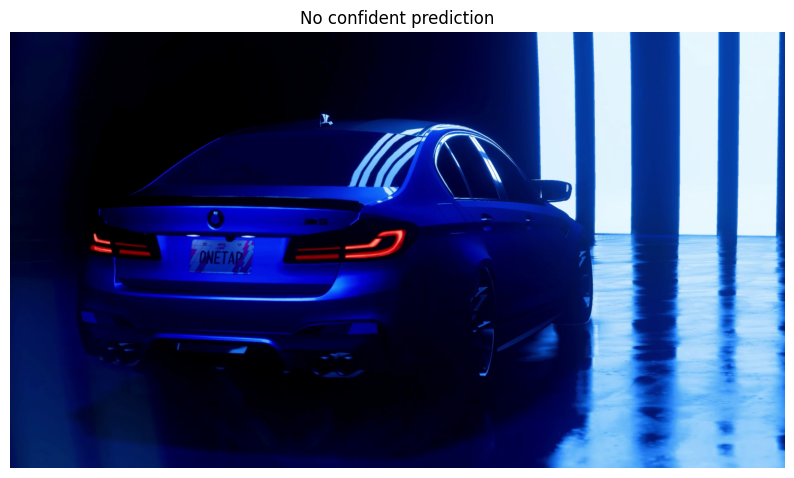

1/1 [==============================] - 0s 123ms/step


<Figure size 640x480 with 0 Axes>

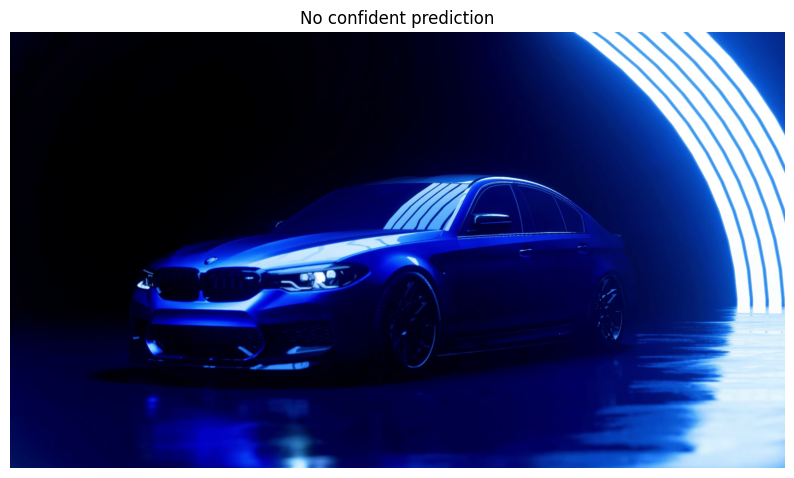

1/1 [==============================] - 0s 130ms/step


<Figure size 640x480 with 0 Axes>

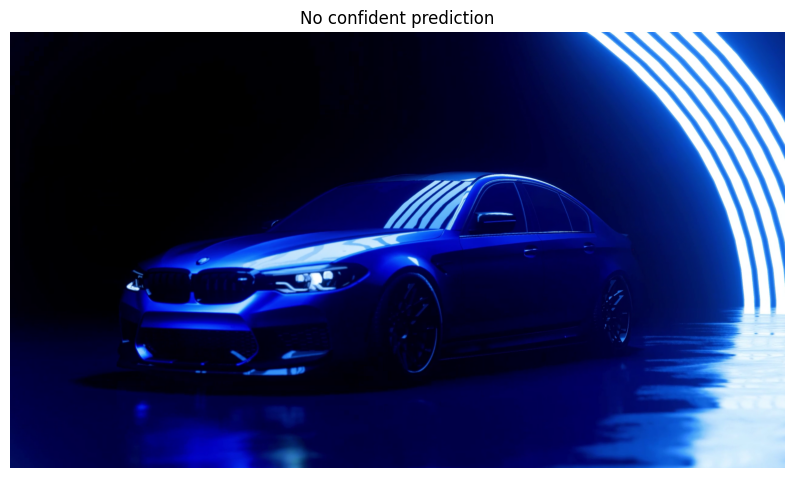

1/1 [==============================] - 0s 136ms/step


<Figure size 640x480 with 0 Axes>

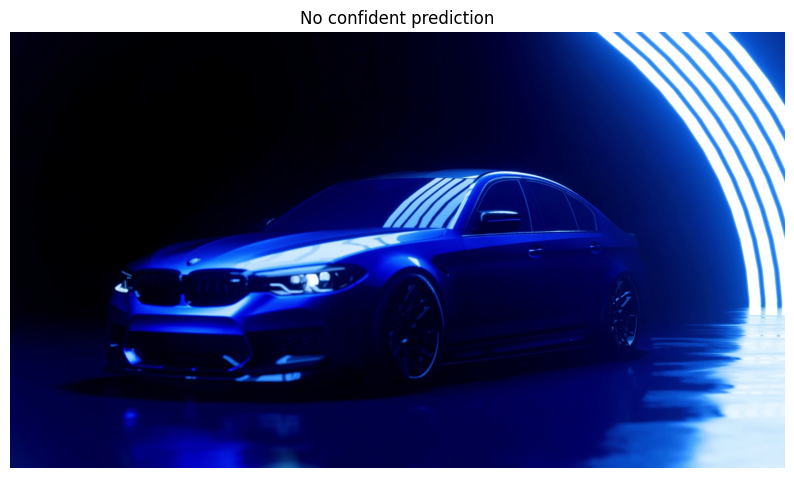

1/1 [==============================] - 0s 128ms/step


<Figure size 640x480 with 0 Axes>

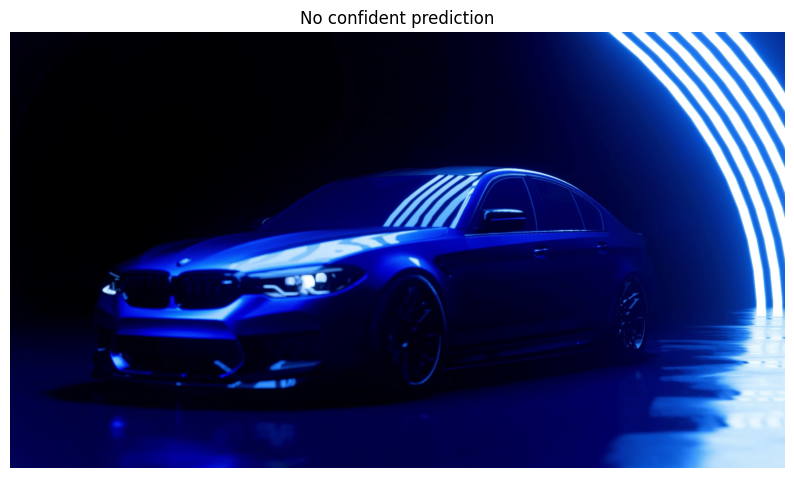

1/1 [==============================] - 0s 121ms/step


<Figure size 640x480 with 0 Axes>

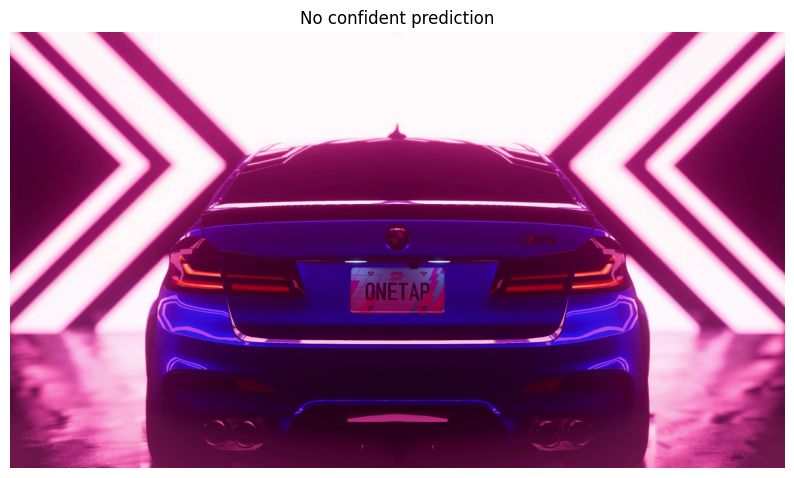

1/1 [==============================] - 0s 81ms/step


<Figure size 640x480 with 0 Axes>

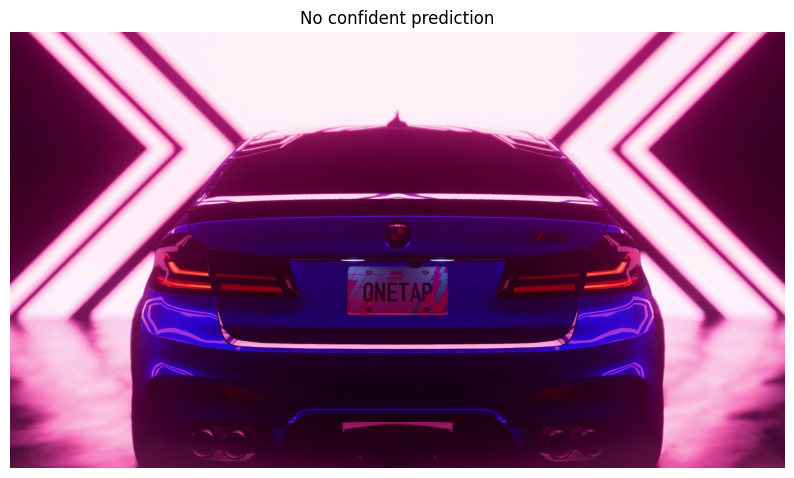

1/1 [==============================] - 0s 123ms/step


<Figure size 640x480 with 0 Axes>

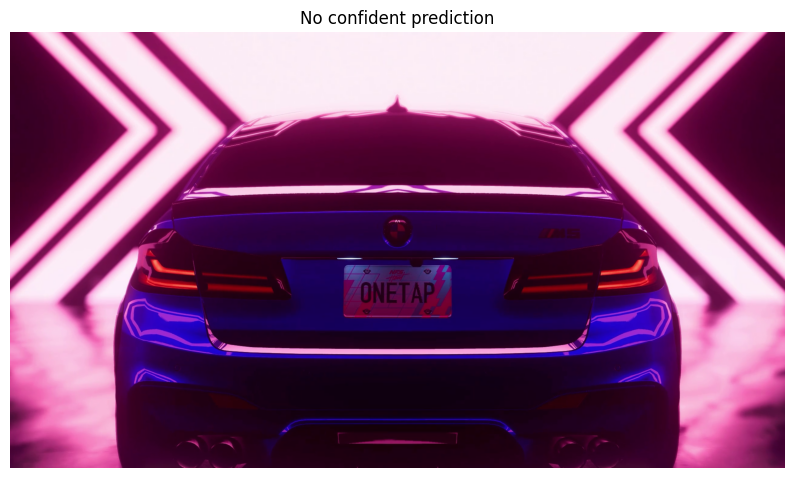

1/1 [==============================] - 0s 117ms/step


<Figure size 640x480 with 0 Axes>

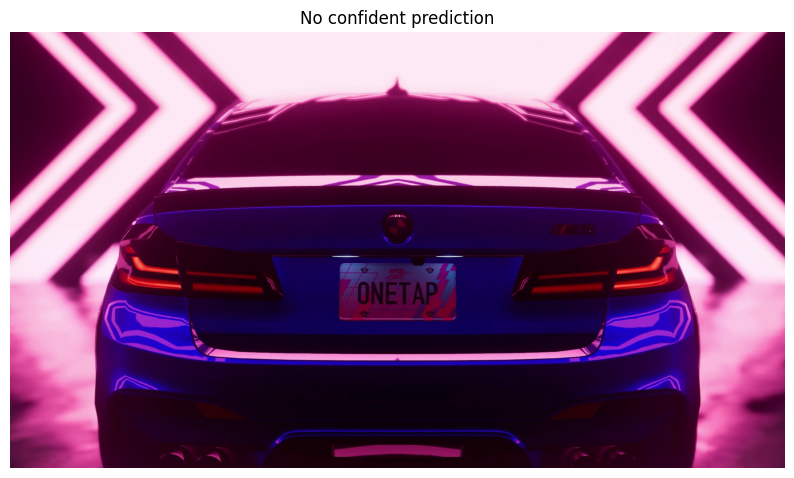

1/1 [==============================] - 0s 120ms/step


<Figure size 640x480 with 0 Axes>

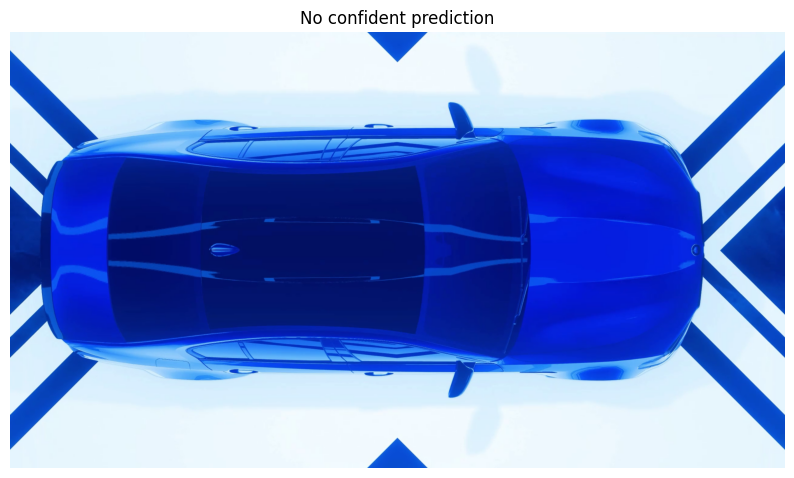

1/1 [==============================] - 0s 89ms/step


<Figure size 640x480 with 0 Axes>

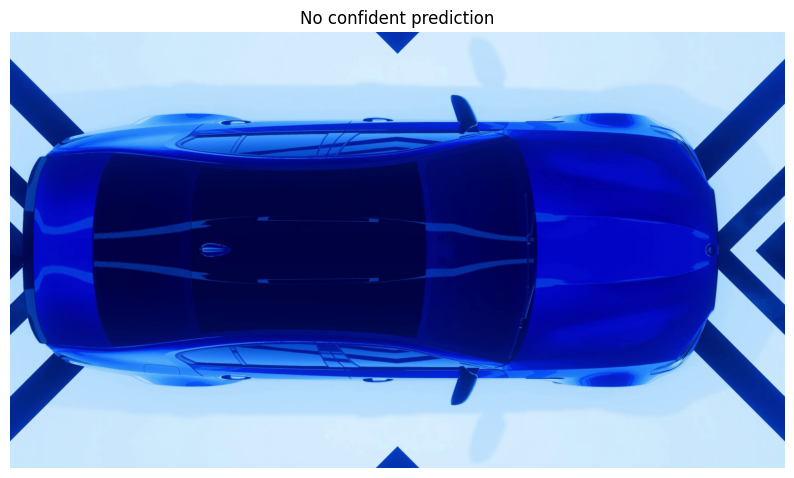

1/1 [==============================] - 0s 136ms/step


<Figure size 640x480 with 0 Axes>

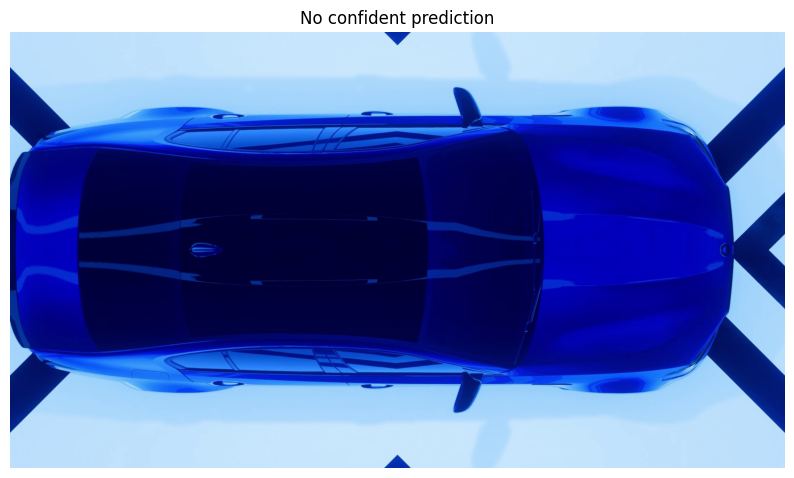

1/1 [==============================] - 0s 132ms/step


<Figure size 640x480 with 0 Axes>

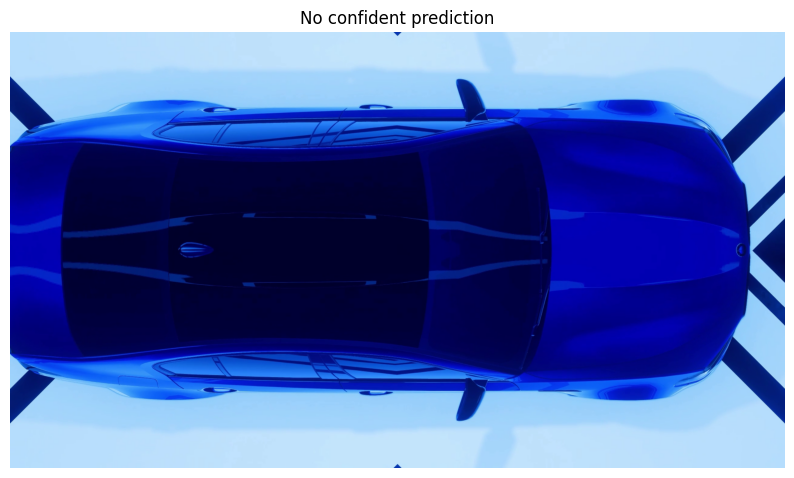

1/1 [==============================] - 0s 121ms/step


<Figure size 640x480 with 0 Axes>

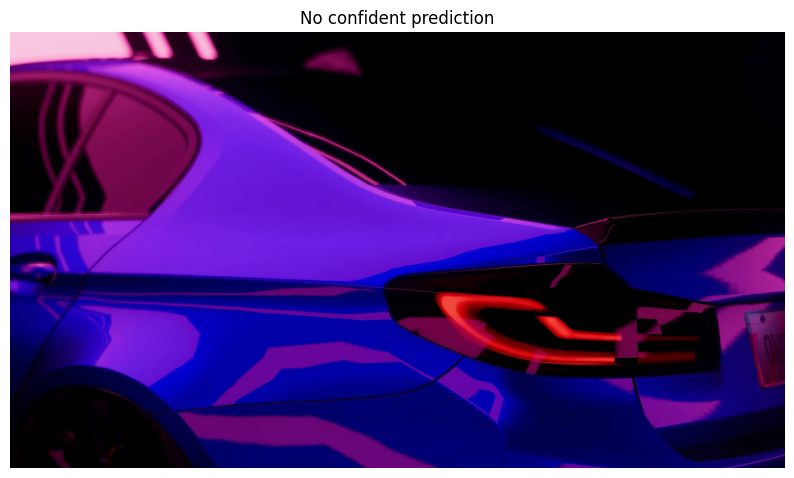

1/1 [==============================] - 0s 116ms/step


<Figure size 640x480 with 0 Axes>

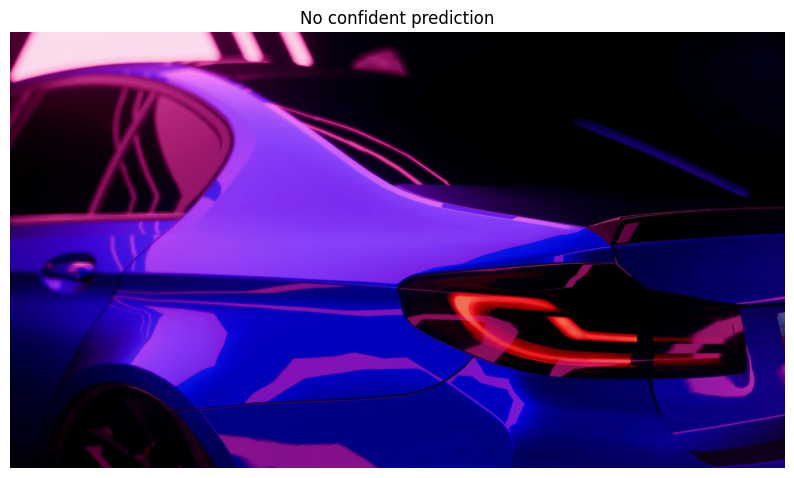

1/1 [==============================] - 0s 99ms/step


<Figure size 640x480 with 0 Axes>

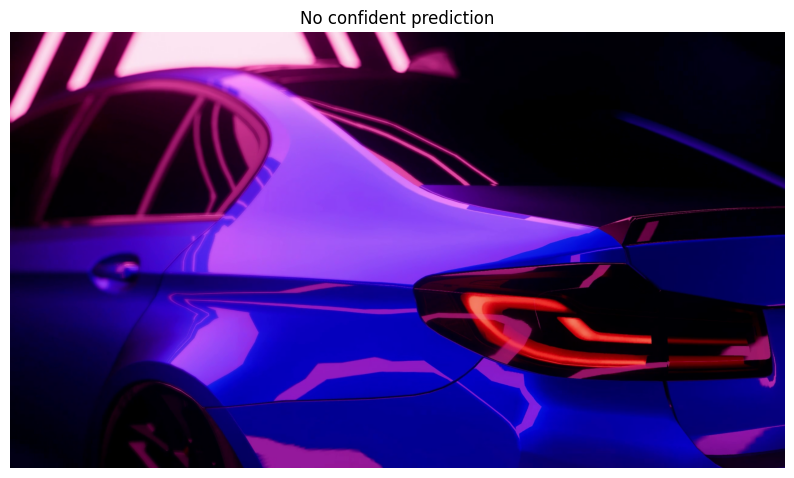

1/1 [==============================] - 0s 126ms/step


<Figure size 640x480 with 0 Axes>

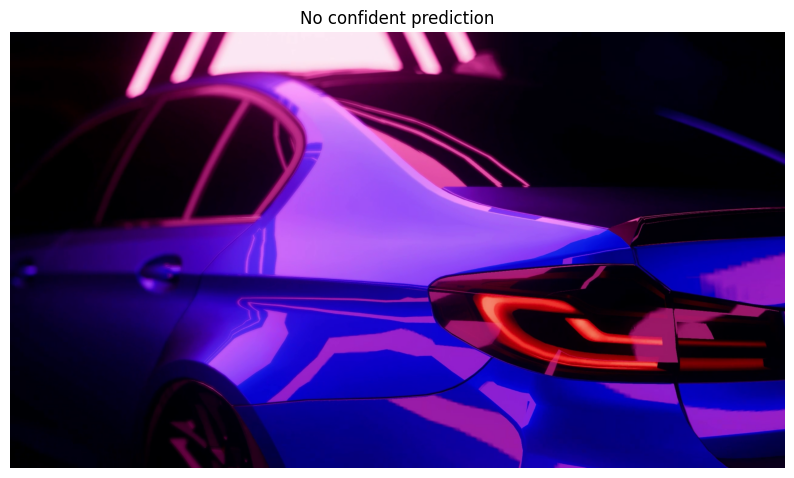

1/1 [==============================] - 0s 128ms/step


<Figure size 640x480 with 0 Axes>

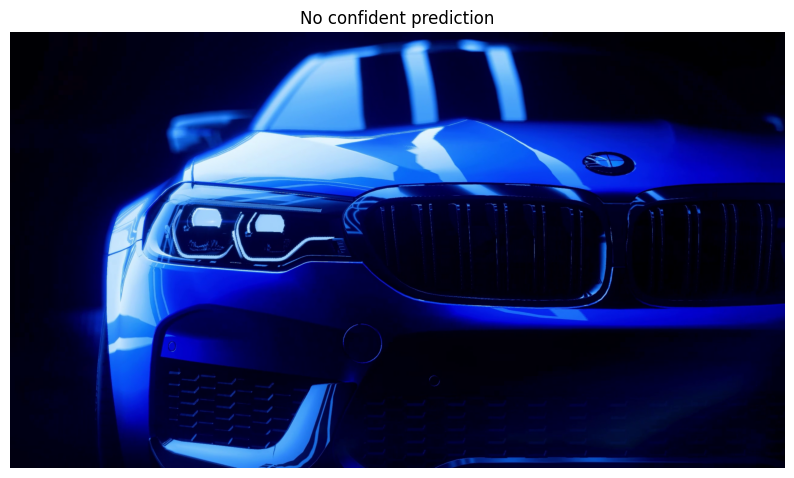

1/1 [==============================] - 0s 129ms/step


<Figure size 640x480 with 0 Axes>

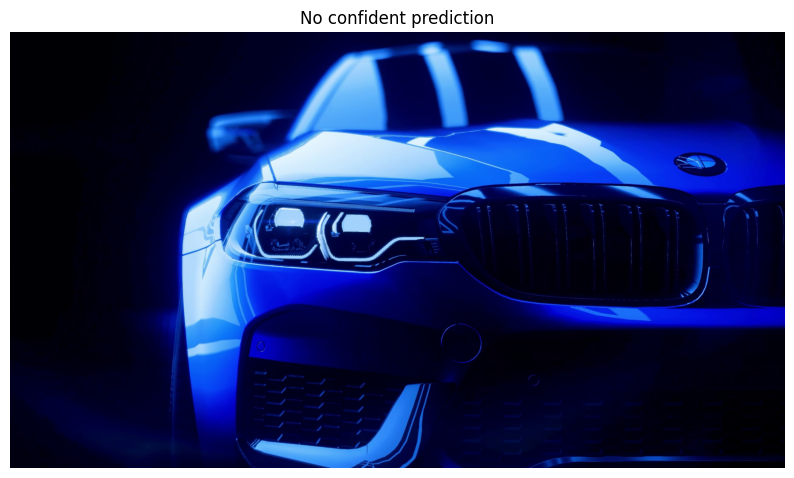

1/1 [==============================] - 0s 104ms/step


<Figure size 640x480 with 0 Axes>

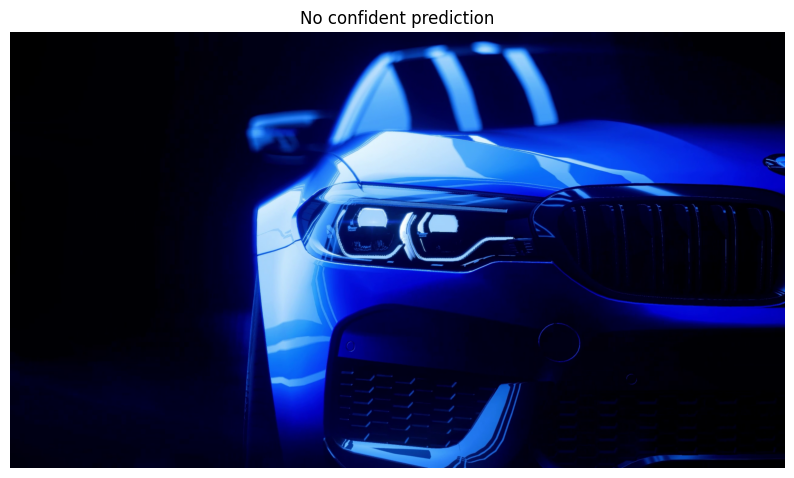

1/1 [==============================] - 0s 104ms/step


<Figure size 640x480 with 0 Axes>

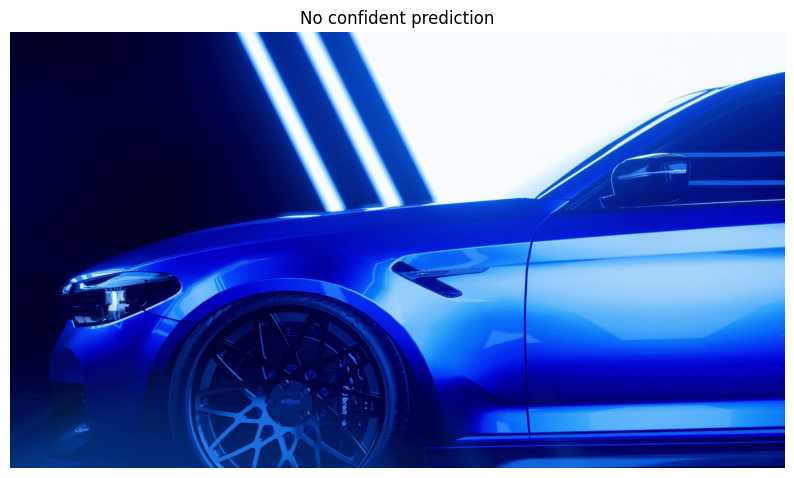

1/1 [==============================] - 0s 149ms/step


<Figure size 640x480 with 0 Axes>

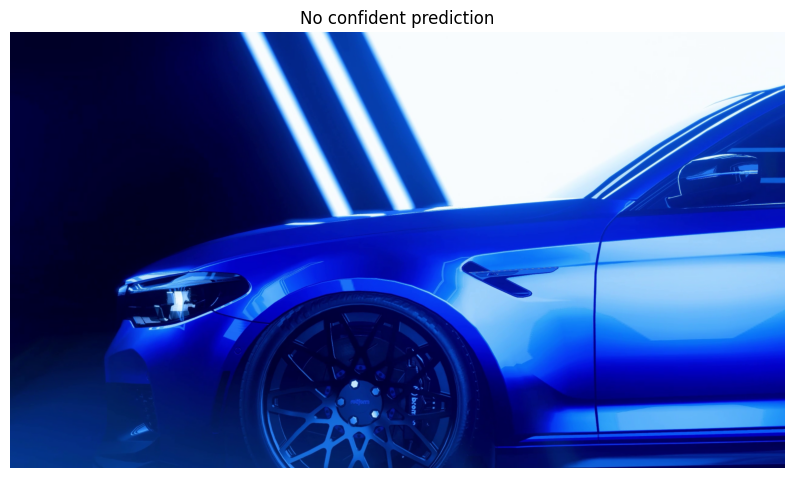

1/1 [==============================] - 0s 70ms/step


<Figure size 640x480 with 0 Axes>

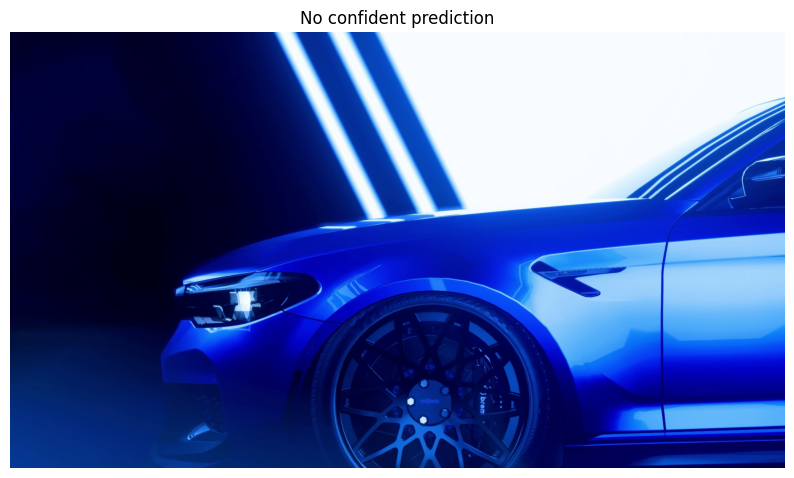

1/1 [==============================] - 0s 89ms/step


<Figure size 640x480 with 0 Axes>

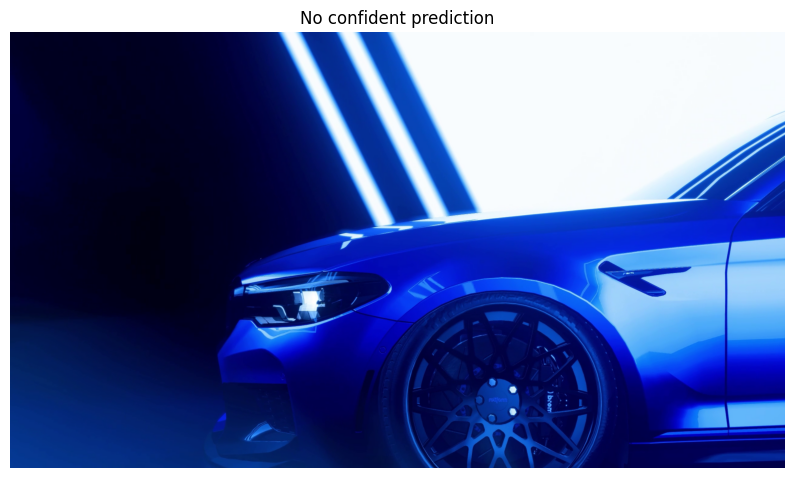

1/1 [==============================] - 0s 125ms/step


<Figure size 640x480 with 0 Axes>

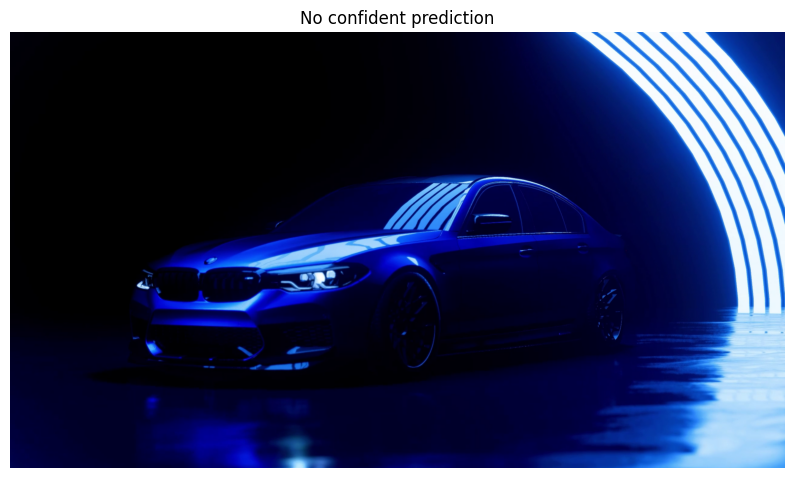

1/1 [==============================] - 0s 101ms/step


<Figure size 640x480 with 0 Axes>

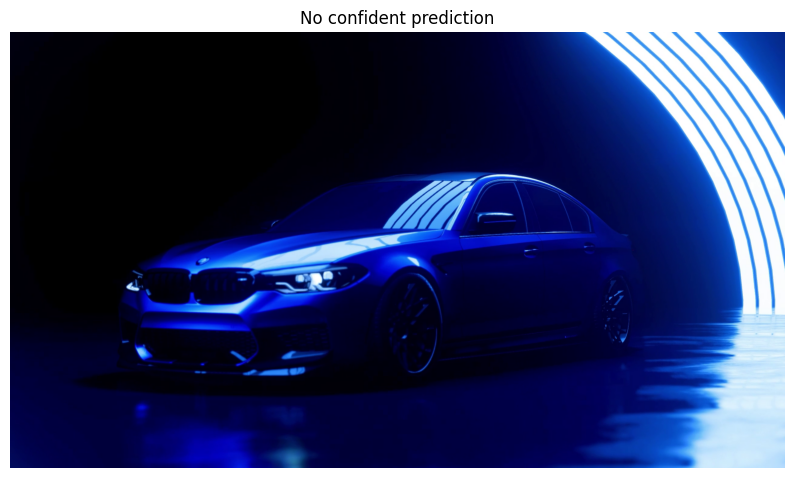

1/1 [==============================] - 0s 137ms/step


<Figure size 640x480 with 0 Axes>

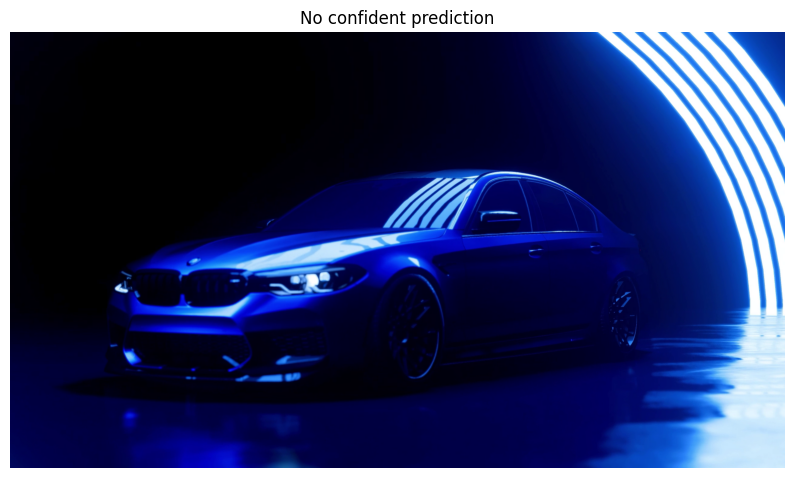

1/1 [==============================] - 0s 108ms/step


<Figure size 640x480 with 0 Axes>

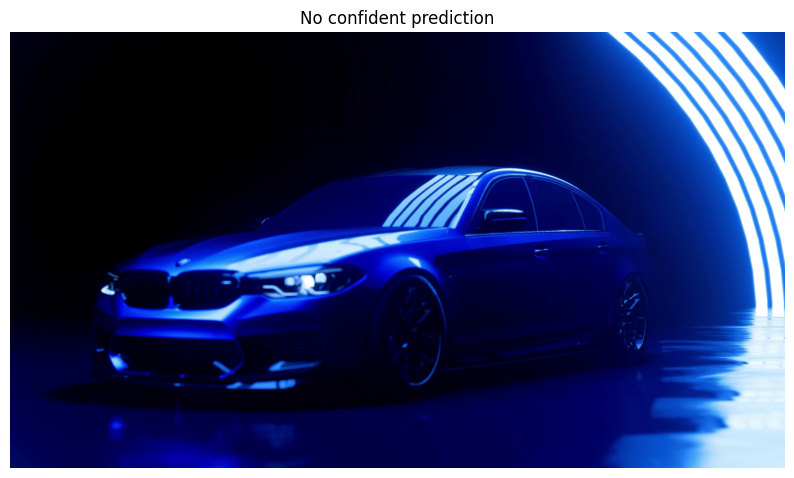

1/1 [==============================] - 0s 92ms/step


<Figure size 640x480 with 0 Axes>

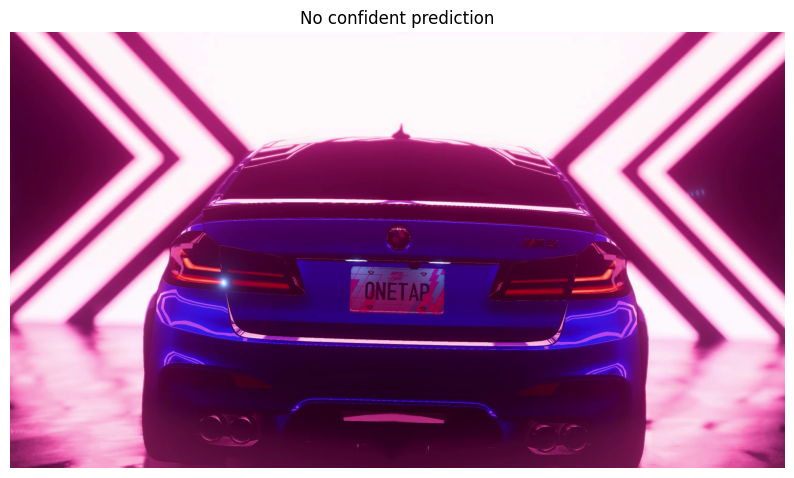

1/1 [==============================] - 0s 135ms/step


<Figure size 640x480 with 0 Axes>

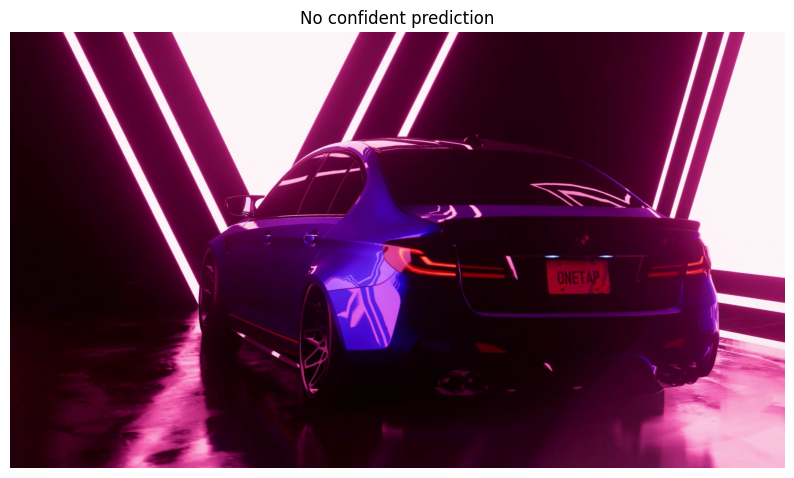

1/1 [==============================] - 0s 136ms/step


<Figure size 640x480 with 0 Axes>

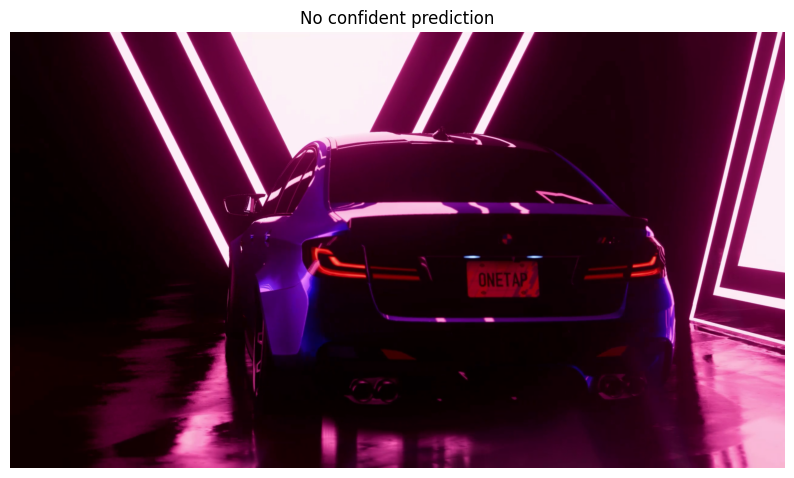

1/1 [==============================] - 0s 96ms/step


<Figure size 640x480 with 0 Axes>

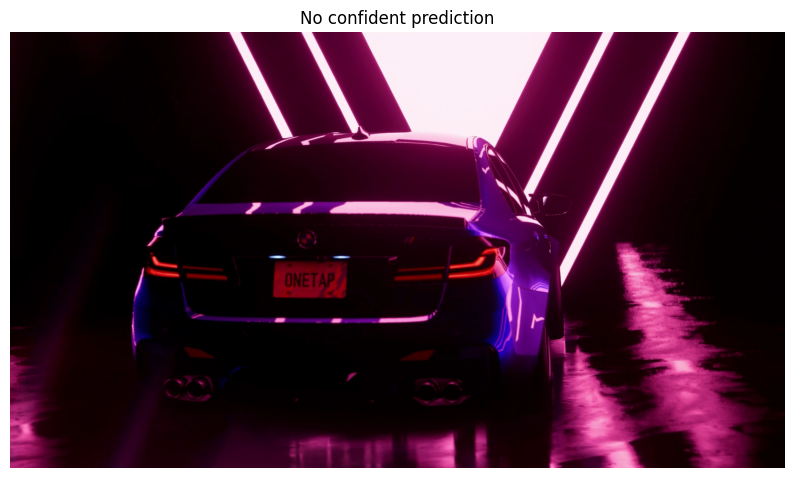

1/1 [==============================] - 0s 134ms/step


<Figure size 640x480 with 0 Axes>

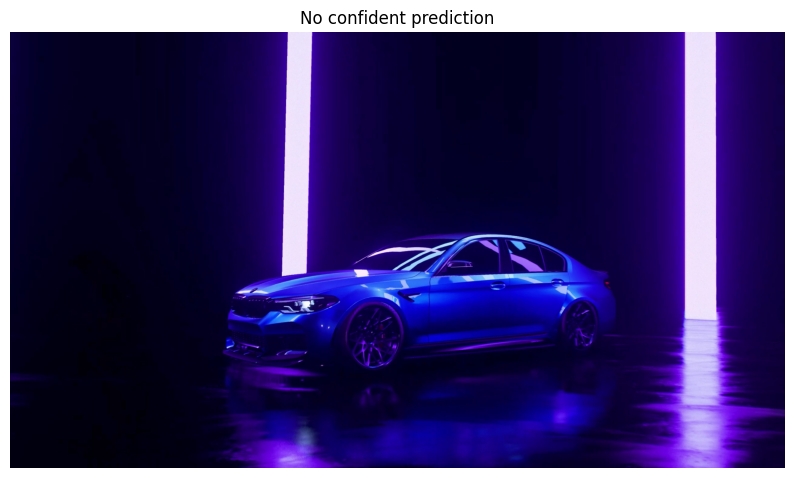

1/1 [==============================] - 0s 84ms/step


<Figure size 640x480 with 0 Axes>

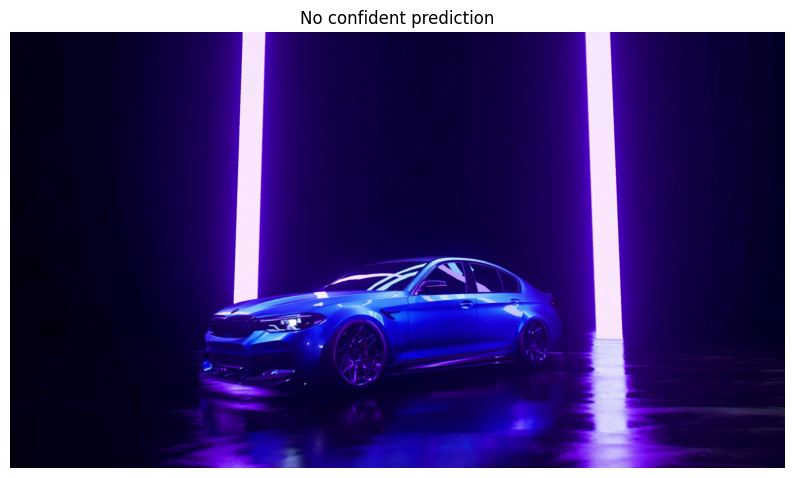

1/1 [==============================] - 0s 113ms/step


<Figure size 640x480 with 0 Axes>

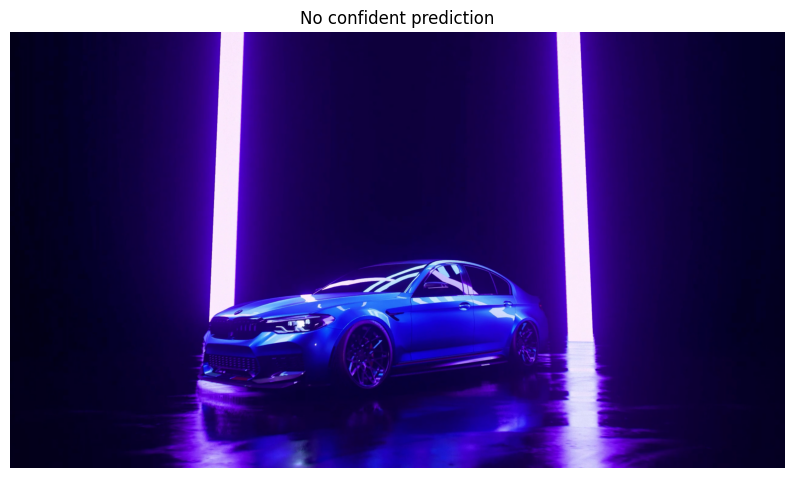

1/1 [==============================] - 0s 141ms/step


<Figure size 640x480 with 0 Axes>

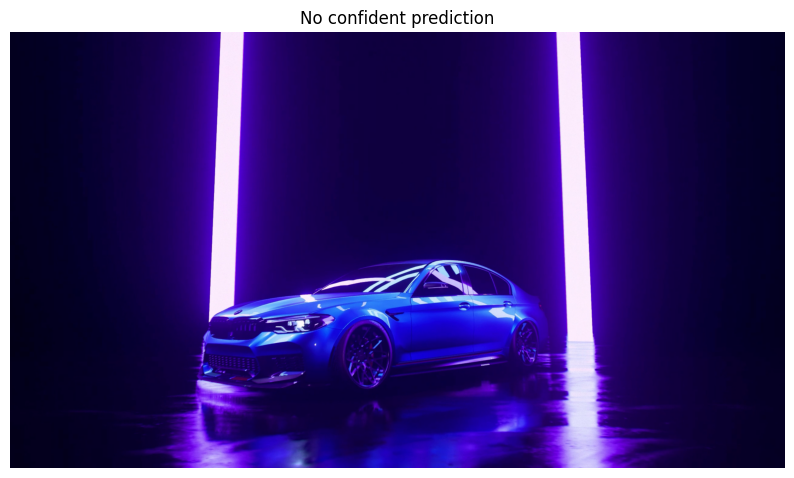

1/1 [==============================] - 0s 131ms/step


<Figure size 640x480 with 0 Axes>

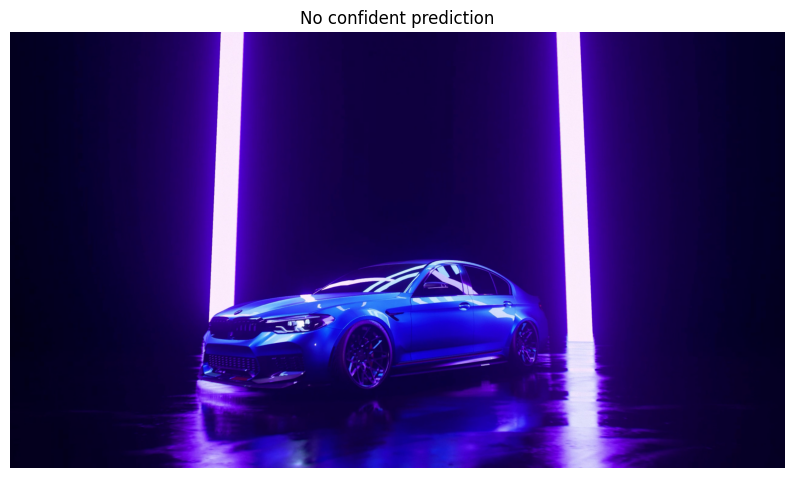

1/1 [==============================] - 0s 108ms/step


<Figure size 640x480 with 0 Axes>

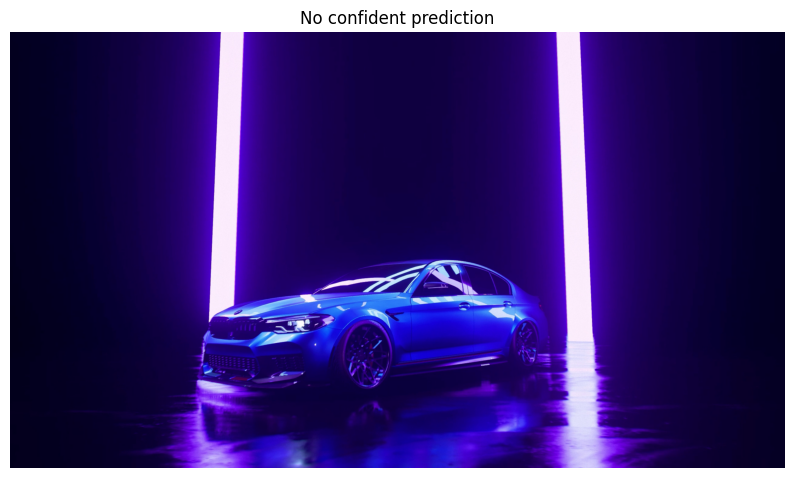

1/1 [==============================] - 0s 131ms/step


<Figure size 640x480 with 0 Axes>

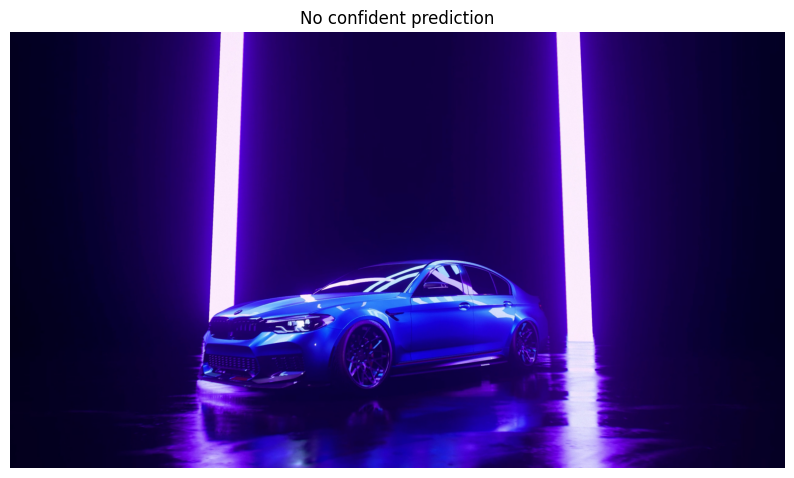

1/1 [==============================] - 0s 125ms/step


<Figure size 640x480 with 0 Axes>

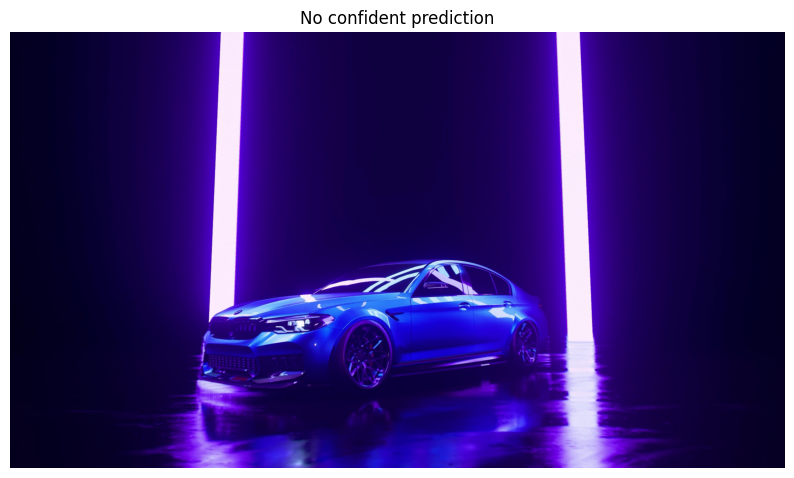

1/1 [==============================] - 0s 123ms/step


<Figure size 640x480 with 0 Axes>

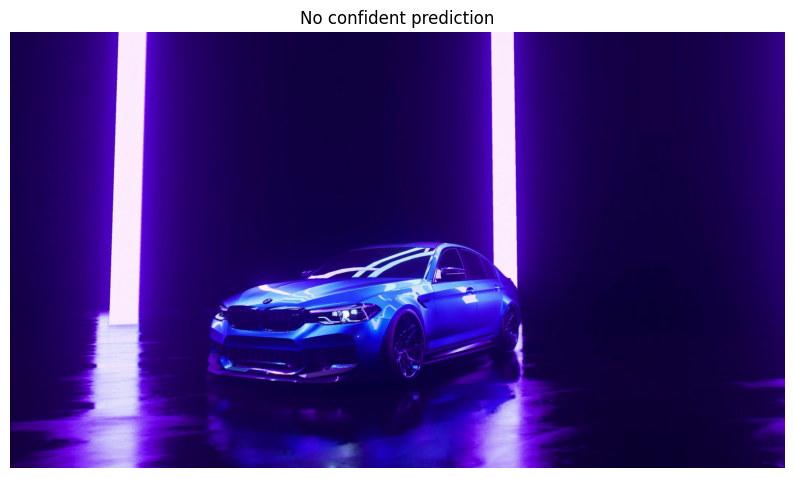

1/1 [==============================] - 0s 94ms/step


<Figure size 640x480 with 0 Axes>

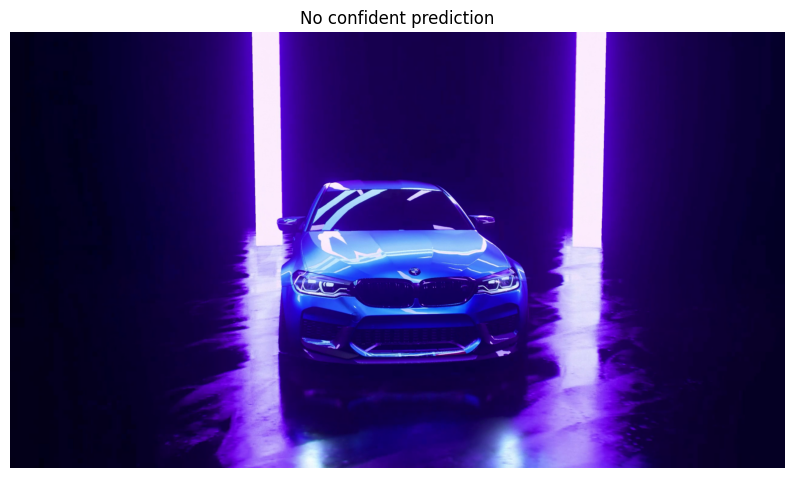

1/1 [==============================] - 0s 119ms/step


<Figure size 640x480 with 0 Axes>

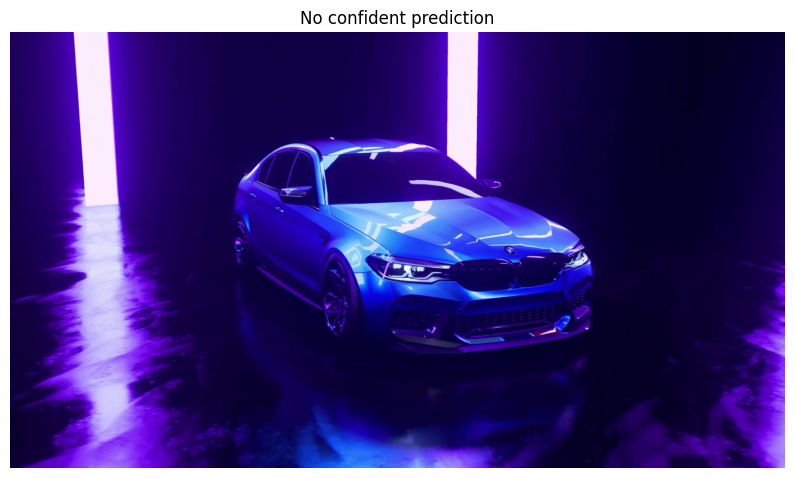

1/1 [==============================] - 0s 79ms/step


<Figure size 640x480 with 0 Axes>

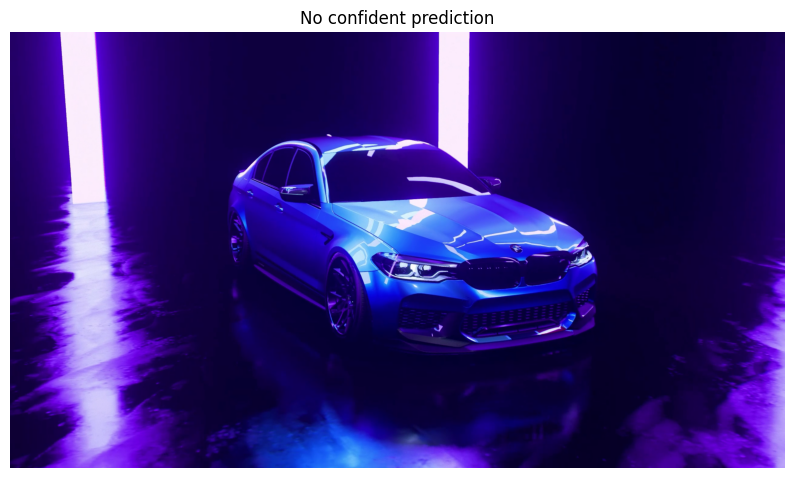

1/1 [==============================] - 0s 121ms/step
Видео завершено на шаге 468. Показ последней информации...


<Figure size 640x480 with 0 Axes>

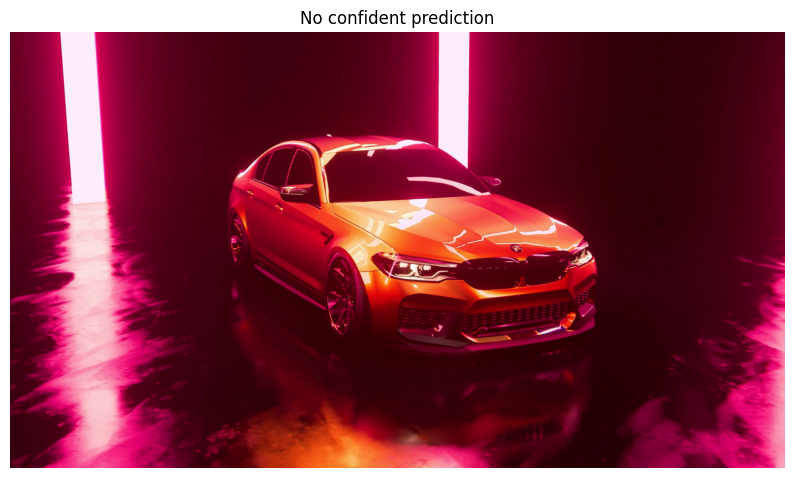

In [6]:
TARGET_SIZE = (224, 224)
THRESHOLD = 0.5

frame_count = 0
last_frame = None

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        print(f"Видео завершено на шаге {frame_count}. Показ последней информации...")
        break

    frame_count += 1
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    resized_frame = cv2.resize(frame_rgb, TARGET_SIZE)
    input_frame = np.expand_dims(resized_frame, axis=0) / 255.0

    predictions = model.predict(input_frame)
    predicted_class = np.argmax(predictions[0])
    confidence = np.max(predictions[0])

    if confidence > THRESHOLD:
        label = f"Tibetan_mastiff: {confidence:.2f}%"  # Пример с вашим классом
    else:
        label = "No confident prediction"

    last_frame = frame_rgb  # Сохраняем последний кадр для отображения

    # Отображение в matplotlib
    if frame_count % 10 == 0 or frame_count == 1:  # Показываем каждый 10-й кадр для оптимизации
        plt.figure(figsize=(10, 10))
        plt.imshow(last_frame)
        plt.title(label)
        plt.axis('off')
        plt.pause(0.1)  # Задержка для отображения
        plt.clf()  # Очистка для следующего кадра

if last_frame is not None:
    frame_rgb = cv2.cvtColor(last_frame, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(frame_rgb)
    plt.title(label)
    plt.axis('off')
    plt.show()

cap.release()